In [ ]:
import numpy as np
import holoviews as hv
from tqdm import trange, tqdm
from math import sqrt, sin
import matplotlib.pyplot as plt

In [ ]:
D = 1
Dr = pow(10,-16)
L = 100
R = L/5
T0 = 0
dx = 0.5
dt = 0.025
space = int(L // dx)
Dxyz = np.full((space,space,space),D)
T = np.zeros((2, space, space, space), dtype=float)

center = L//(2*dx)+1
r = R/dx
for i in range(int(center-r-1),int(center+r+1)):
    for j in range(int(center-r-1),int(center+r+1)):
        for k in range(int(center-r-1),int(center+r+1)):
            if(pow(i-center+1,2)+pow(j-center+1,2)+pow(k-center+1,2)<=r**2):
                Dxyz[i][j][k] = Dr

probes = np.array([[0.3*L,0.3*L,0.5*L],
                   [0.3*L,0.7*L,0.5*L],
                   [0.7*L,0.7*L,0.5*L],
                   [0.7*L,0.3*L,0.5*L]],
                   dtype=int)

heater1_pos = np.array([0.2*L/dx, 0.5*L/dx, 0.5*L/dx], dtype = int)
heater1_size = np.array([4/dx, 0.2*L/dx, 0.2*L/dx], dtype = int)
heater2_values = np.array([100,50,0],dtype = int)

heater2_pos = np.array([0.5*L/dx, 0.2*L/dx, 0.5*L/dx],dtype = int)
heater2_size = np.array([0.2*L/dx, 4/dx, 0.2*L/dx],dtype = int)
heater1_values=np.array([100,77,10],dtype = int)


t = 600
iterations = int(t/dt)



probe1_values = np.zeros((iterations), dtype=float)
probe2_values = np.zeros((iterations), dtype=float)
probe3_values = np.zeros((iterations), dtype=float)
probe4_values = np.zeros((iterations), dtype=float)

In [ ]:
#Функции
def isolation(T):
    T[:, 0, :, :] = T[:, 1, :, :]
    T[:, :, -1, :] = T[:, :, -2, :]
    T[:, -1, :, :] = 0 #T[:, -2, :, :]
    T[:, :, 0, :]  = 0 #T[:, :, 1, :]
    T[:, :, :, 0]  = T[:, :, :, 1]
    T[:, :, :, -1]  = T[:, :, :, -2]
    
    
def heat(T, heater_pos, heater_size, p,theta,phi,it):
    cur = it % 2
    T[cur,heater_pos[0]-heater_size[0]:heater_pos[0]+heater_size[0] + 1, \
      heater_pos[1]-heater_size[1]:heater_pos[1]+heater_size[1] + 1, \
      heater_pos[2]-heater_size[2]:heater_pos[2]+heater_size[2] + 1] += p*(sin(2*np.pi*it*dt/theta+phi) + 1)*dt
    

def diffuse_step_numpy(ti, T, Dxyz):
    ti = ti % 2
    tj = (ti + 1) % 2
    g = dt * Dxyz[1:-1, 1:-1, 1:-1] / dx**2
    T[tj,1:-1,1:-1,1:-1] = T[ti, 1:-1, 1:-1, 1:-1] + g*(T[ti, 2: , 1:-1, 1:-1 ] +
                                                        T[ti, :-2, 1:-1, 1:-1 ] +
                                                        T[ti, 1:-1, 2: , 1:-1 ] +
                                                        T[ti, 1:-1,  :-2, 1:-1] +
                                                        T[ti, 1:-1, 1:-1, 2:  ] +
                                                        T[ti, 1:-1, 1:-1,  :-2] -
                                                        6*T[ti, 1:-1, 1:-1, 1:-1])

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
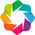

:DynamicMap   []
   :Overlay
      .Image.I  :Image   [x,y]   (z)
      .Points.I :Points   [x,y]
      .Text.I   :Text   [x,y]
      .Text.II  :Text   [x,y]
      .Text.III :Text   [x,y]
      .Text.IV  :Text   [x,y]

In [ ]:
pipe = hv.streams.Pipe()

def heatmap(data):
    return hv.Image(T[0, ::-1, :, int(center)], bounds=(0, 0, L, L)).opts(width=800, 
                                         height=600, 
                                         colorbar=True,
                                         cmap='magma',
                                                       ) * hv.Points(probes) \
                                                         * hv.Text(0.3*L+1,0.3*L, '0').opts(color='#fffffe') \
                                                         * hv.Text(0.3*L+1,0.7*L, '1').opts(color='#fffffe') \
                                                         * hv.Text(0.7*L+1,0.3*L, '3').opts(color='#fffffe') \
                                                         * hv.Text(0.7*L+1,0.7*L, '2').opts(color='#fffffe')
                                                         
hv.extension('bokeh')
hv.DynamicMap(heatmap, streams = [pipe])

In [ ]:
#Подстчёт для пары (dx, dt) = 4, 0.2
for it in trange(iterations):
    heat(T, heater1_pos,  heater1_size, heater1_values[0],heater1_values[1],heater1_values[2],it)
    heat(T, heater2_pos,  heater2_size, heater2_values[0],heater2_values[1],heater2_values[2],it)
    diffuse_step_numpy(it, T, Dxyz)
    isolation(T)
    if it % (iterations // 50) == 0:
        pipe.send(0)
    probe1_values[it] = T[1, probes[0,0]//dx + 1, probes[0,1]//dx+1, probes[0,2]//dx]
    probe2_values[it] = T[1, probes[1,0]//dx + 1, probes[1,1]//dx+ 1, probes[1,2]//dx]
    probe3_values[it] = T[1, probes[2,0]//dx + 1, probes[2,1]//dx+ 1, probes[2,2]//dx]
    probe4_values[it] = T[1, probes[3,0]//dx + 1, probes[3,1]//dx+ 1, probes[3,2]//dx]

100%|██████████| 3000/3000 [00:06<00:00, 483.37it/s]


In [ ]:
#Сохраняем данные для этой пары
np.save('T_4_02.npy', T)
np.save('probe1_values_4_02.npy', probe1_values)
np.save('probe2_values_4_02.npy', probe2_values)
np.save('probe3_values_4_02.npy', probe3_values)
np.save('probe4_values_4_02.npy', probe4_values)

In [ ]:
#Подстчёт для пары (dx, dt) = 2, 0.1
for it in trange(iterations):
    heat(T, heater1_pos,  heater1_size, heater1_values[0],heater1_values[1],heater1_values[2],it)
    heat(T, heater2_pos,  heater2_size, heater2_values[0],heater2_values[1],heater2_values[2],it)
    diffuse_step_numpy(it, T, Dxyz)
    isolation(T)
    if it % (iterations // 50) == 0:
        pipe.send(0)
    probe1_values[it] = T[1, probes[0,0]//dx + 1, probes[0,1]//dx + 1, probes[0,2]//dx]
    probe2_values[it] = T[1, probes[1,0]//dx + 1, probes[1,1]//dx + 1, probes[1,2]//dx]
    probe3_values[it] = T[1, probes[2,0]//dx + 1, probes[2,1]//dx + 1, probes[2,2]//dx]
    probe4_values[it] = T[1, probes[3,0]//dx + 1, probes[3,1]//dx + 1, probes[3,2]//dx]

100%|██████████| 6000/6000 [00:24<00:00, 249.19it/s]


In [ ]:
#Сохраняем данные для этой пары
np.save('T_2_01.npy', T)
np.save('probe1_values_2_01.npy', probe1_values)
np.save('probe2_values_2_01.npy', probe2_values)
np.save('probe3_values_2_01.npy', probe3_values)
np.save('probe4_values_2_01.npy', probe4_values)

In [ ]:
#Подстчёт для пары (dx, dt) = 1, 0.05
for it in trange(iterations):
    heat(T, heater1_pos,  heater1_size, heater1_values[0],heater1_values[1],heater1_values[2],it)
    heat(T, heater2_pos,  heater2_size, heater2_values[0],heater2_values[1],heater2_values[2],it)
    diffuse_step_numpy(it, T, Dxyz)
    isolation(T)
    if it % (iterations // 50) == 0:
        pipe.send(0)
    probe1_values[it] = T[1, probes[0,0]//dx + 1, probes[0,1]//dx + 1, probes[0,2]//dx]
    probe2_values[it] = T[1, probes[1,0]//dx + 1, probes[1,1]//dx + 1, probes[1,2]//dx]
    probe3_values[it] = T[1, probes[2,0]//dx + 1, probes[2,1]//dx + 1, probes[2,2]//dx]
    probe4_values[it] = T[1, probes[3,0]//dx + 1, probes[3,1]//dx + 1, probes[3,2]//dx]

100%|██████████| 12000/12000 [04:32<00:00, 43.98it/s]


In [ ]:
#Сохраняем данные для этой пары
np.save('T_1_005.npy', T)
np.save('probe1_values_1_005.npy', probe1_values)
np.save('probe2_values_1_005.npy', probe2_values)
np.save('probe3_values_1_005.npy', probe3_values)
np.save('probe4_values_1_005.npy', probe4_values)

In [ ]:
#Подстчёт для пары (dx, dt) = 0.5, 0.025
for it in trange(iterations):
    heat(T, heater1_pos,  heater1_size, heater1_values[0],heater1_values[1],heater1_values[2],it)
    heat(T, heater2_pos,  heater2_size, heater2_values[0],heater2_values[1],heater2_values[2],it)
    diffuse_step_numpy(it, T, Dxyz)
    isolation(T)
    if it % (iterations // 50) == 0:
        pipe.send(0)
    probe1_values[it] = T[1, int(probes[0,0]//dx + 1), int(probes[0,1]//dx + 1), int(probes[0,2]//dx)]
    probe2_values[it] = T[1, int(probes[1,0]//dx + 1), int(probes[1,1]//dx + 1), int(probes[1,2]//dx)]
    probe3_values[it] = T[1, int(probes[2,0]//dx + 1), int(probes[2,1]//dx + 1), int(probes[2,2]//dx)]
    probe4_values[it] = T[1, int(probes[3,0]//dx + 1), int(probes[3,1]//dx + 1), int(probes[3,2]//dx)]

100%|██████████| 24000/24000 [1:14:42<00:00,  5.35it/s]


In [ ]:
#Сохраняем данные для этой пары
np.save('T_05_0025.npy', T)
np.save('probe1_values_05_0025.npy', probe1_values)
np.save('probe2_values_05_0025.npy', probe2_values)
np.save('probe3_values_05_0025.npy', probe3_values)
np.save('probe4_values_05_0025.npy', probe4_values)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
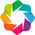

:Overlay
   .Image.I  :Image   [x,y]   (z)
   .Points.I :Points   [x,y]
   .Text.I   :Text   [x,y]
   .Text.II  :Text   [x,y]
   .Text.III :Text   [x,y]
   .Text.IV  :Text   [x,y]

In [ ]:
#Загружаем данные для пары (4, 0.2) и строим тепловую карту
T_map_4_02 = np.load('T_4_02.npy')
center = int(L//(2*4))
hv.extension('bokeh')
hv.Image(T_map_4_02[0, ::-1, :, center-1], bounds=(0, 0, L, L)).opts(width=800, 
                                         height=600, 
                                         colorbar=True,
                                         cmap='magma',
                                                       ) * hv.Points(probes) \
                                                         * hv.Text(0.3*L+1,0.3*L, '0').opts(color='#fffffe') \
                                                         * hv.Text(0.3*L+1,0.7*L, '1').opts(color='#fffffe') \
                                                         * hv.Text(0.7*L+1,0.3*L, '3').opts(color='#fffffe') \
                                                         * hv.Text(0.7*L+1,0.7*L, '2').opts(color='#fffffe')

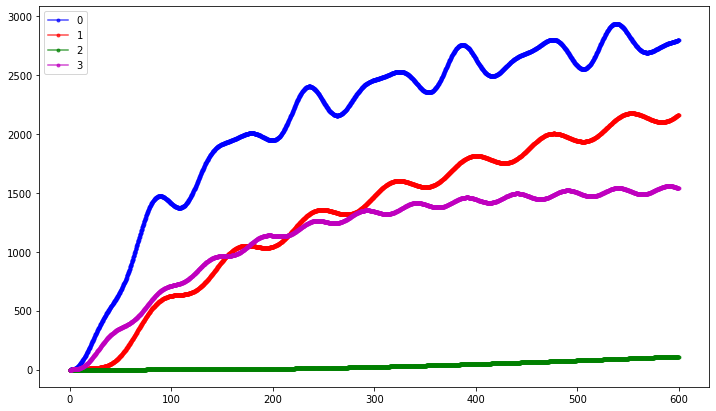

In [ ]:
#Теперь загружаем значения проб для этой пары и строим графики

probe1_values_load_4_02 = np.load('probe1_values_4_02.npy') 
probe2_values_load_4_02 = np.load('probe2_values_4_02.npy') 
probe3_values_load_4_02 = np.load('probe3_values_4_02.npy') 
probe4_values_load_4_02 = np.load('probe4_values_4_02.npy')
times_4_02 = np.arange(0, 600, 0.2)

plt.figure(figsize=(12, 7))
plt.plot(times_4_02, probe1_values_load_4_02, '.-b', alpha=0.7, label="0")
plt.plot(times_4_02, probe2_values_load_4_02, '.-r', alpha=0.7, label="1")
plt.plot(times_4_02, probe3_values_load_4_02, '.-g', alpha=0.7, label="2")
plt.plot(times_4_02, probe4_values_load_4_02, '.-m', alpha=0.7, label="3")
plt.legend()

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
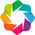

:Overlay
   .Image.I  :Image   [x,y]   (z)
   .Points.I :Points   [x,y]
   .Text.I   :Text   [x,y]
   .Text.II  :Text   [x,y]
   .Text.III :Text   [x,y]
   .Text.IV  :Text   [x,y]

In [ ]:
#Загружаем данные для пары (2, 0.1) и строим тепловую карту
T_map_2_01 = np.load('T_2_01.npy')
center = int(L//(2*2))
hv.extension('bokeh')
hv.Image(T_map_2_01[0, ::-1, :, center-1], bounds=(0, 0, L, L)).opts(width=800, 
                                         height=600, 
                                         colorbar=True,
                                         cmap='magma',
                                                       ) * hv.Points(probes) \
                                                         * hv.Text(0.3*L+1,0.3*L, '0').opts(color='#fffffe') \
                                                         * hv.Text(0.3*L+1,0.7*L, '1').opts(color='#fffffe') \
                                                         * hv.Text(0.7*L+1,0.3*L, '3').opts(color='#fffffe') \
                                                         * hv.Text(0.7*L+1,0.7*L, '2').opts(color='#fffffe')

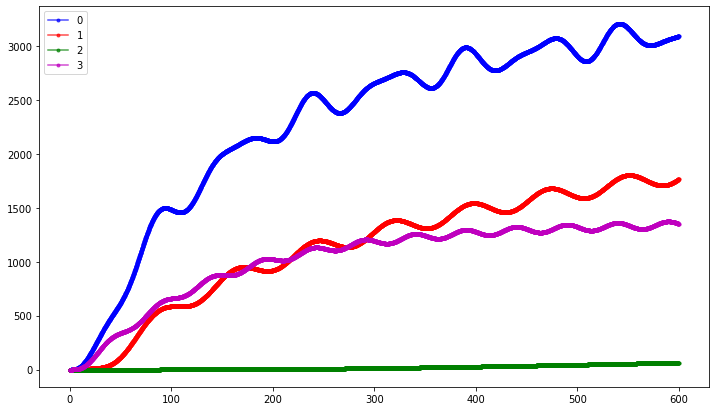

In [ ]:
#Теперь загружаем значения проб для этой пары и строим графики

probe1_values_load_2_01 = np.load('probe1_values_2_01.npy') 
probe2_values_load_2_01 = np.load('probe2_values_2_01.npy') 
probe3_values_load_2_01 = np.load('probe3_values_2_01.npy') 
probe4_values_load_2_01 = np.load('probe4_values_2_01.npy')
times_2_01 = np.arange(0, 600, 0.1)

plt.figure(figsize=(12, 7))
plt.plot(times_2_01, probe1_values_load_2_01, '.-b', alpha=0.7, label="0")
plt.plot(times_2_01, probe2_values_load_2_01, '.-r', alpha=0.7, label="1")
plt.plot(times_2_01, probe3_values_load_2_01, '.-g', alpha=0.7, label="2")
plt.plot(times_2_01, probe4_values_load_2_01, '.-m', alpha=0.7, label="3")
plt.legend()

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
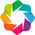

:Overlay
   .Image.I  :Image   [x,y]   (z)
   .Points.I :Points   [x,y]
   .Text.I   :Text   [x,y]
   .Text.II  :Text   [x,y]
   .Text.III :Text   [x,y]
   .Text.IV  :Text   [x,y]

In [ ]:
#Загружаем данные для пары (1, 0.05) и строим тепловую карту
T_map_1_005 = np.load('T_1_005.npy')
center = int(L//2)
hv.extension('bokeh')
hv.Image(T_map_1_005[0, ::-1, :, center], bounds=(0, 0, L, L)).opts(width=800, 
                                         height=600, 
                                         colorbar=True,
                                         cmap='magma',
                                                       ) * hv.Points(probes) \
                                                         * hv.Text(0.3*L+1,0.3*L, '0').opts(color='#fffffe') \
                                                         * hv.Text(0.3*L+1,0.7*L, '1').opts(color='#fffffe') \
                                                         * hv.Text(0.7*L+1,0.3*L, '3').opts(color='#fffffe') \
                                                         * hv.Text(0.7*L+1,0.7*L, '2').opts(color='#fffffe')

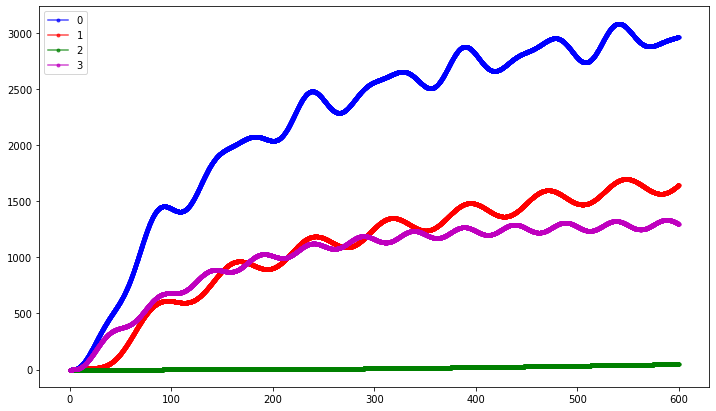

In [ ]:
#Теперь загружаем значения проб для этой пары и строим графики

probe1_values_load_1_005 = np.load('probe1_values_1_005.npy') 
probe2_values_load_1_005 = np.load('probe2_values_1_005.npy') 
probe3_values_load_1_005 = np.load('probe3_values_1_005.npy') 
probe4_values_load_1_005 = np.load('probe4_values_1_005.npy')
times_1_005 = np.arange(0, 600, 0.05)

plt.figure(figsize=(12, 7))
plt.plot(times_1_005, probe1_values_load_1_005, '.-b', alpha=0.7, label="0")
plt.plot(times_1_005, probe2_values_load_1_005, '.-r', alpha=0.7, label="1")
plt.plot(times_1_005, probe3_values_load_1_005, '.-g', alpha=0.7, label="2")
plt.plot(times_1_005, probe4_values_load_1_005, '.-m', alpha=0.7, label="3")
plt.legend()

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
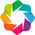

:Overlay
   .Image.I  :Image   [x,y]   (z)
   .Points.I :Points   [x,y]
   .Text.I   :Text   [x,y]
   .Text.II  :Text   [x,y]
   .Text.III :Text   [x,y]
   .Text.IV  :Text   [x,y]

In [ ]:
#Загружаем данные для пары (0.5, 0.025) и строим тепловую карту
T_map_05_0025 = np.load('T_05_0025.npy')
center = int(L//(2*0.5))
hv.extension('bokeh')
hv.Image(T_map_05_0025[0, ::-1, :, center], bounds=(0, 0, L, L)).opts(width=800, 
                                         height=600, 
                                         colorbar=True,
                                         cmap='magma',
                                                       ) * hv.Points(probes) \
                                                         * hv.Text(0.3*L+1,0.3*L, '0').opts(color='#fffffe') \
                                                         * hv.Text(0.3*L+1,0.7*L, '1').opts(color='#fffffe') \
                                                         * hv.Text(0.7*L+1,0.3*L, '3').opts(color='#fffffe') \
                                                         * hv.Text(0.7*L+1,0.7*L, '2').opts(color='#fffffe')

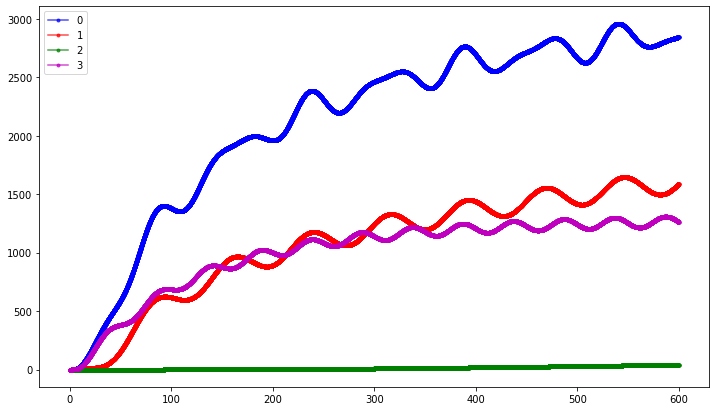

In [ ]:
#Теперь загружаем значения проб для этой пары и строим графики

probe1_values_load_05_0025 = np.load('probe1_values_05_0025.npy') 
probe2_values_load_05_0025 = np.load('probe2_values_05_0025.npy') 
probe3_values_load_05_0025 = np.load('probe3_values_05_0025.npy') 
probe4_values_load_05_0025 = np.load('probe4_values_05_0025.npy')
times_05_0025 = np.arange(0, 600, 0.025)

plt.figure(figsize=(12, 7))
plt.plot(times_05_0025, probe1_values_load_05_0025, '.-b', alpha=0.7, label="0")
plt.plot(times_05_0025, probe2_values_load_05_0025, '.-r', alpha=0.7, label="1")
plt.plot(times_05_0025, probe3_values_load_05_0025, '.-g', alpha=0.7, label="2")
plt.plot(times_05_0025, probe4_values_load_05_0025, '.-m', alpha=0.7, label="3")
plt.legend()

In [ ]:
from scipy.signal import find_peaks

In [ ]:
def get_periods(farray, N, dt, my_height=2):
  r = np.fft.rfft(farray)
  amp = np.abs(r)/(N/2)
  freq = np.fft.rfftfreq(N, dt)
  idx, h = find_peaks(amp, height=my_height)
  return freq[idx]**-1

def show_periods(farray, mstr):
  if farray.size == 0:
    print("В пробе " + mstr + " периодов не обнаружено")
  else:
    print("В пробе " + mstr +  " обнаружены следующие периоды: ")
    for period in farray:
      print(period)

In [ ]:
#Восстановим периоды колебаний в местах установки проб при (dx, dt) = (4, 0.2)
print("Восстановим периоды колебаний в местах установки проб при (dx, dt) = (4, 0.2)")
probe1_periods = get_periods(probe1_values_load_4_02, 3000, 0.2, 2)
show_periods(probe1_periods, "0")
probe2_periods = get_periods(probe2_values_load_4_02, 3000, 0.2, 2)
show_periods(probe2_periods, "1")
probe3_periods = get_periods(probe3_values_load_4_02, 3000, 0.2, 2)
show_periods(probe3_periods, "2")
probe4_periods = get_periods(probe4_values_load_4_02, 3000, 0.2, 2)
show_periods(probe4_periods, "3")

Восстановим периоды колебаний в местах установки проб при (dx, dt) = (4, 0.2)
В пробе 0 обнаружены следующие периоды: 
66.66666666666666
50.0
В пробе 1 обнаружены следующие периоды: 
66.66666666666666
В пробе 2 периодов не обнаружено
В пробе 3 обнаружены следующие периоды: 
50.0


In [ ]:
#Восстановим периоды колебаний в местах установки проб при (dx, dt) = (2, 0.1)
print("Восстановим периоды колебаний в местах установки проб при (dx, dt) = (2, 0.1)")
probe1_periods = get_periods(probe1_values_load_2_01, 6000, 0.1, 2)
show_periods(probe1_periods, "0")
probe2_periods = get_periods(probe2_values_load_2_01, 6000, 0.1, 2)
show_periods(probe2_periods, "1")
probe3_periods = get_periods(probe3_values_load_2_01, 6000, 0.1, 2)
show_periods(probe3_periods, "2")
probe4_periods = get_periods(probe4_values_load_2_01, 6000, 0.1, 2)
show_periods(probe4_periods, "3")

Восстановим периоды колебаний в местах установки проб при (dx, dt) = (2, 0.1)
В пробе 0 обнаружены следующие периоды: 
66.66666666666666
50.0
В пробе 1 обнаружены следующие периоды: 
66.66666666666666
В пробе 2 периодов не обнаружено
В пробе 3 обнаружены следующие периоды: 
50.0


In [ ]:
#Восстановим периоды колебаний в местах установки проб при (dx, dt) = (1, 0.05)
print("Восстановим периоды колебаний в местах установки проб при (dx, dt) = (1, 0.05)")
probe1_periods = get_periods(probe1_values_load_1_005, 12000, 0.05, 2)
show_periods(probe1_periods, "0")
probe2_periods = get_periods(probe2_values_load_1_005, 12000, 0.05, 2)
show_periods(probe2_periods, "1")
probe3_periods = get_periods(probe3_values_load_1_005, 12000, 0.05, 2)
show_periods(probe3_periods, "2")
probe4_periods = get_periods(probe4_values_load_1_005, 12000, 0.05, 2)
show_periods(probe4_periods, "3")

Восстановим периоды колебаний в местах установки проб при (dx, dt) = (1, 0.05)
В пробе 0 обнаружены следующие периоды: 
66.66666666666666
50.0
В пробе 1 обнаружены следующие периоды: 
66.66666666666666
В пробе 2 периодов не обнаружено
В пробе 3 обнаружены следующие периоды: 
50.0


In [ ]:
#Восстановим периоды колебаний в местах установки проб при (dx, dt) = (0.5, 0.025)
print("Восстановим периоды колебаний в местах установки проб при (dx, dt) = (0.5, 0.025)")
probe1_periods = get_periods(probe1_values_load_05_0025, 24000, 0.025, 2)
show_periods(probe1_periods, "0")
probe2_periods = get_periods(probe2_values_load_05_0025, 24000, 0.025, 2)
show_periods(probe2_periods, "1")
probe3_periods = get_periods(probe3_values_load_05_0025, 24000, 0.025, 2)
show_periods(probe3_periods, "2")
probe4_periods = get_periods(probe4_values_load_05_0025, 24000, 0.025, 2)
show_periods(probe4_periods, "3")

Восстановим периоды колебаний в местах установки проб при (dx, dt) = (0.5, 0.025)
В пробе 0 обнаружены следующие периоды: 
66.66666666666666
50.0
В пробе 1 обнаружены следующие периоды: 
66.66666666666666
В пробе 2 периодов не обнаружено
В пробе 3 обнаружены следующие периоды: 
50.0
